# Importing the required libraries

In [1]:
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.models import load_model
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.model_selection import train_test_split

# Extracting the city coordinates from the TSP file

In [2]:
directory = "instances\\instances"
tsp_files = [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.tsp')]

all_data = []
node_counts = []

for tsp_file in tqdm(tsp_files, desc="Processing files"):
    with open(tsp_file, 'r') as file:
        line = next(file)
        while "NODE_COORD_SECTION" not in line:
            line = next(file)
        data = file.readlines()
        data = data[:-1]
        data = np.array([[float(x) for x in line.split()[1:]] for line in data])
        all_data.append(data)
        node_counts.append(len(data))

average_node_count = sum(node_counts) / len(node_counts)
print(f"Average node count: {average_node_count}")

Processing files:   0%|          | 0/85 [00:00<?, ?it/s]

Processing files: 100%|██████████| 85/85 [00:00<00:00, 1512.11it/s]

Average node count: 29.0


In [3]:
all_data

[array([[6075.80690883, 6465.45909703],
        [1805.70936324, 7995.40708724],
        [5445.28520579, 4709.20131029],
        [4958.44692288, 4673.99712767],
        [2533.03662596, 3778.68980327],
        [5038.68622672, 9796.68082874],
        [6903.3503692 , 4121.00671839],
        [7731.86159653, 8600.15855725],
        [6109.27394038, 4844.82230302],
        [5669.76696326, 6325.04570949],
        [4203.46698965, 9567.63730817],
        [9513.85872349, 7458.0256731 ],
        [8418.09143448, 2834.239121  ],
        [3805.69633892,  701.2654226 ],
        [3408.63315541, 4874.74892224],
        [3582.42753262, 6734.82379683],
        [7579.38368103, 8807.63612896],
        [4465.23067265, 4254.65677598],
        [3426.01275677, 6253.61220366],
        [6655.96131254, 5903.31317429],
        [6321.24269797, 5975.00697937],
        [6949.93866269, 5136.07976256],
        [3670.93053929, 5273.2679205 ],
        [8398.71945481, 1526.18903204],
        [8242.73103951, 2731.55327006],


# Graphing the city coordinates

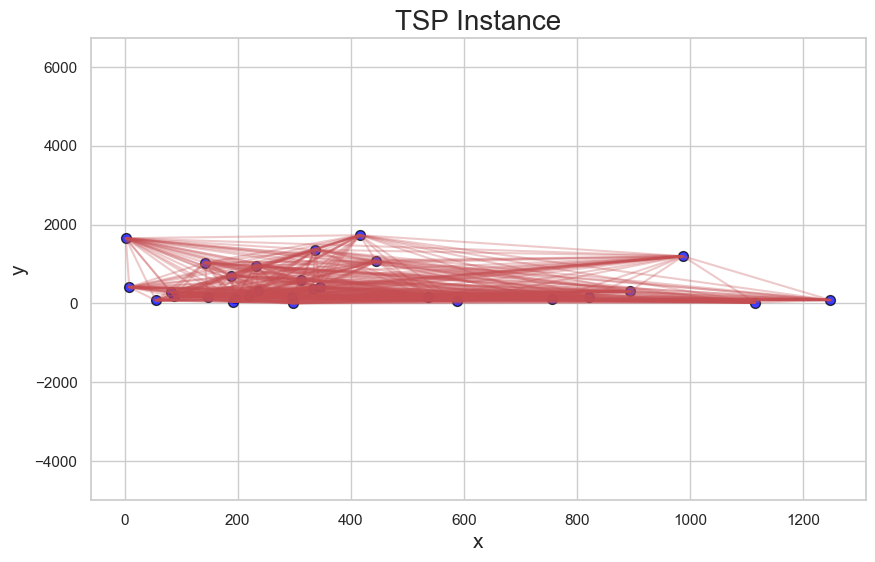

In [4]:
sns.set(style="whitegrid")
data = random.choice(all_data)
x, y = data[:, 0], data[:, 1]

plt.figure(figsize=(10, 6))
plt.scatter(x, y, s=50, c='blue', edgecolors='black', linewidth=1, alpha=0.75)

for j in range(len(x)):
    for k in range(j+1, len(x)):
        plt.plot([x[j], x[k]], [y[j], y[k]], 'r-', alpha=0.3)

plt.ylim(min(y) - 5000, max(y) + 5000)

plt.title('TSP Instance', fontsize=20)
plt.xlabel('x', fontsize=15)
plt.ylabel('y', fontsize=15)

plt.show()

# Normalizing the coordinates

In [37]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaler.fit(np.concatenate(all_data))

normalized_data = [scaler.transform(data) for data in all_data]

In [38]:
normalized_data

[array([[0.60905016, 0.64681862],
        [0.18092877, 0.79988062],
        [0.54583384, 0.47111571],
        [0.49702328, 0.46759374],
        [0.25385084, 0.37802368],
        [0.5050681 , 0.98008711],
        [0.69201994, 0.41227041],
        [0.77508675, 0.86038233],
        [0.61240557, 0.48468376],
        [0.56834046, 0.63277112],
        [0.42132874, 0.9571727 ],
        [0.95375037, 0.74611888],
        [0.84388838, 0.28353713],
        [0.38144812, 0.07014608],
        [0.34163844, 0.48767774],
        [0.35906312, 0.67376693],
        [0.75979926, 0.8811392 ],
        [0.44757325, 0.42564129],
        [0.34338092, 0.62562463],
        [0.66721663, 0.59057934],
        [0.63365763, 0.59775187],
        [0.6966909 , 0.5138223 ],
        [0.36793646, 0.52754714],
        [0.84194614, 0.15267467],
        [0.82630669, 0.27326404],
        [0.58495173, 0.68632335],
        [0.63420133, 0.43600413],
        [0.84630092, 0.08248348],
        [0.50255429, 0.36172303]]),
 array([[3.1

In [39]:
train_data, temp_data = train_test_split(normalized_data, test_size=0.2, random_state=42)
validation_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

# Defining the architecture of the autoencoder

In [54]:
def create_autoencoder(neurons=64):
    encoding_dim = 20

    input_data = Input(shape=(29,2))

    # Encoder
    encoded = Dense(neurons, activation='relu')(input_data)
    encoded = Dense(encoding_dim, activation='relu', activity_regularizer=regularizers.l1(10e-5))(encoded)  

    # Decoder
    decoded = Dense(neurons, activation='relu')(encoded)
    decoded = Dense(2, activation='sigmoid')(decoded)

    # Autoencoder = Encoder + Decoder
    autoencoder = Model(input_data, decoded)

    # Separate Encoder model
    encoder = Model(input_data, encoded)

    # Separate Decoder model
    encoded_input = Input(shape=(encoding_dim,))
    decoder_layer1 = autoencoder.layers[-2]
    decoder_layer2 = autoencoder.layers[-1]
    decoder = Model(encoded_input, decoder_layer2(decoder_layer1(encoded_input)))

    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder, encoder, decoder

In [55]:
autoencoder, encoder, decoder = create_autoencoder(neurons=50)
autoencoder.summary()

Model: "model_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 29, 2)]           0         
                                                                 
 dense_40 (Dense)            (None, 29, 50)            150       
                                                                 
 dense_41 (Dense)            (None, 29, 20)            1020      
                                                                 
 dense_42 (Dense)            multiple                  1050      
                                                                 
 dense_43 (Dense)            multiple                  102       
                                                                 
Total params: 2322 (9.07 KB)
Trainable params: 2322 (9.07 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [56]:
if not os.path.exists('models'):
    os.makedirs('models')

train_data = np.stack(train_data, axis=0)
test_data = np.stack(test_data, axis=0)
validation_data = np.stack(validation_data, axis=0)
for neurons in range(10, 51):
    print(f"Training model with {neurons} neurons")
    autoencoder, encoder, decoder = create_autoencoder(neurons=neurons)
    model_path = os.path.join('models', f'best_model_TSP_With_Less_HiddenLayer_with_train_test{neurons}.h5')
    checkpoint = ModelCheckpoint(model_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
    history = autoencoder.fit(train_data, train_data, epochs=2000, validation_data=(validation_data, validation_data), verbose=0, callbacks=[checkpoint])

Training model with 10 neurons

Epoch 1: val_loss improved from inf to 0.11477, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 2: val_loss improved from 0.11477 to 0.11409, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 3: val_loss improved from 0.11409 to 0.11342, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 4: val_loss improved from 0.11342 to 0.11274, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 5: val_loss improved from 0.11274 to 0.11205, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 6: val_loss improved from 0.11205 to 0.11134, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 7: val_loss improved from 0.11134 to 0.11062, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 8: val_loss improved from 0.11062 to 0.10989, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 9: val_loss improved from 0.10989 to 0.10914, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 10: val_loss improved from 0.10914 to 0.10837, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 11: val_loss improved from 0.10837 to 0.10761, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 12: val_loss improved from 0.10761 to 0.10683, saving model to models\best_model_TSP_With_Less_HiddenLayer_with_train_test10.h5

Epoch 13: val_loss improved from 0.10683 to 0.10598, savin

# Evaluating the models

- **Clustering**: Performing a clustering algorithm like K-means on the encoded data. If the autoencoder is learning useful features, similar graphs should be grouped together in the same cluster. We can then manually inspect some clusters to see if this is the case.

## Clustering

In [57]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

1/1 [==============================] - 0s 170ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


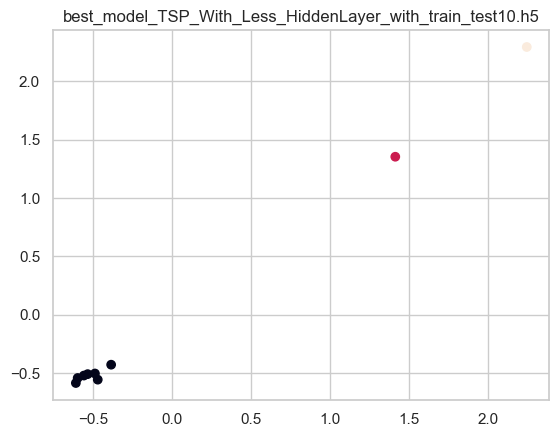

1/1 [==============================] - 0s 212ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


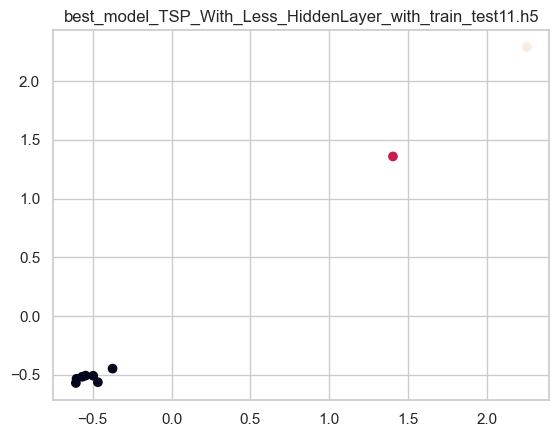

1/1 [==============================] - 0s 367ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


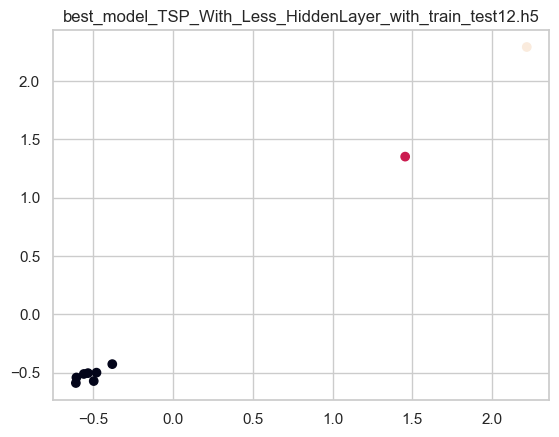

1/1 [==============================] - 0s 290ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


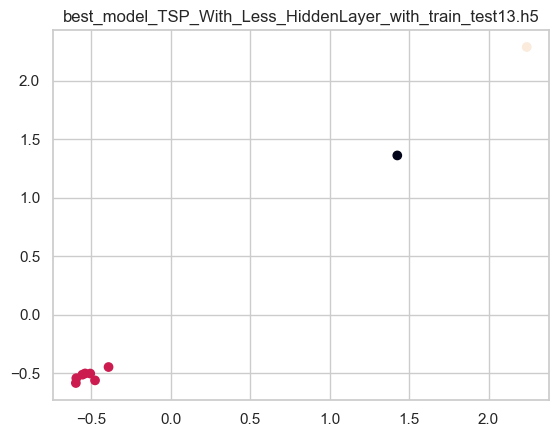

1/1 [==============================] - 0s 301ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


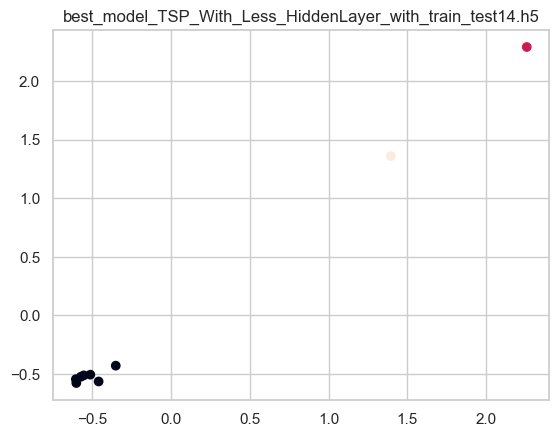

1/1 [==============================] - 0s 190ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


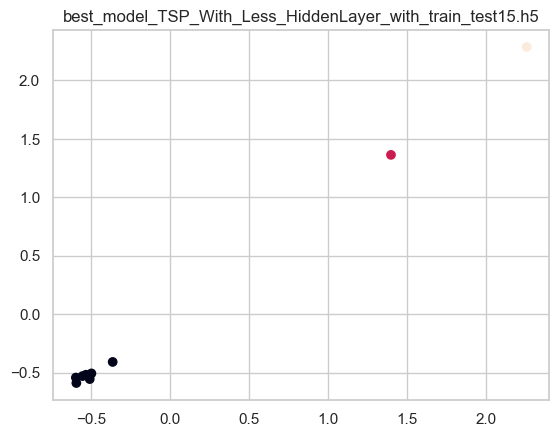

1/1 [==============================] - 0s 279ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


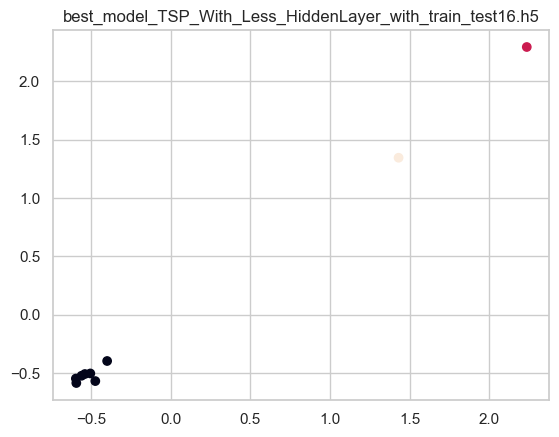

1/1 [==============================] - 0s 147ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


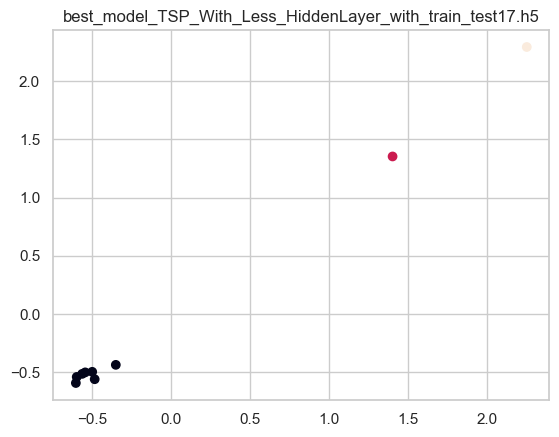

1/1 [==============================] - 0s 163ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


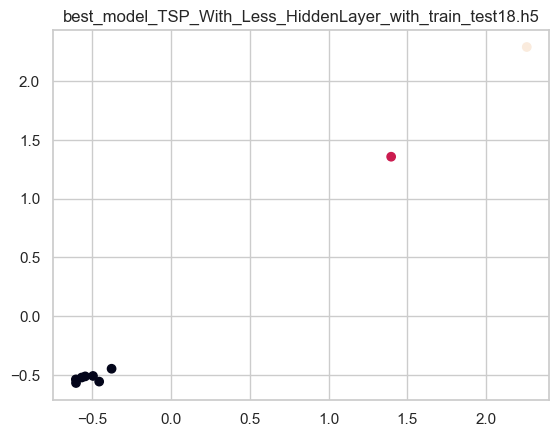

1/1 [==============================] - 0s 204ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


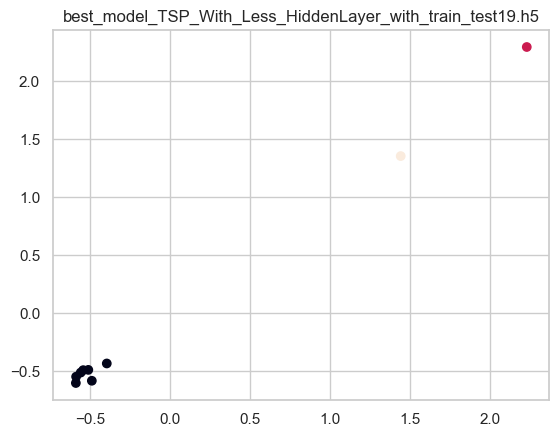

1/1 [==============================] - 0s 200ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


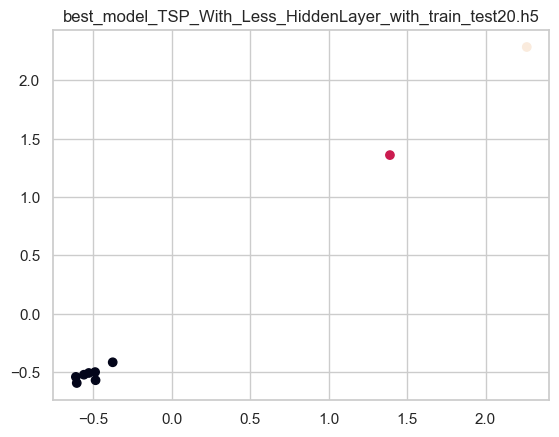

1/1 [==============================] - 0s 157ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


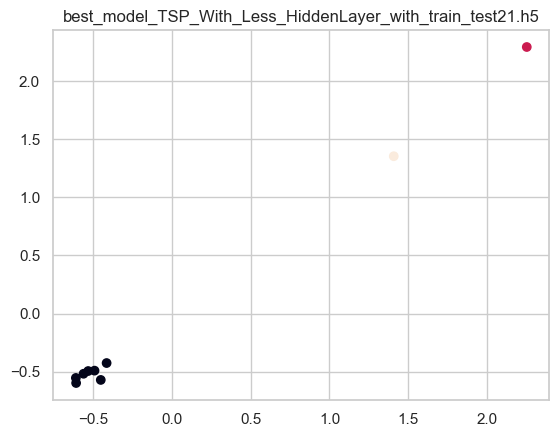

1/1 [==============================] - 0s 135ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


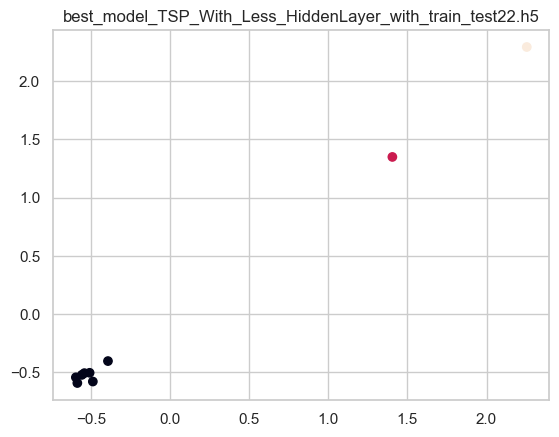

1/1 [==============================] - 0s 175ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


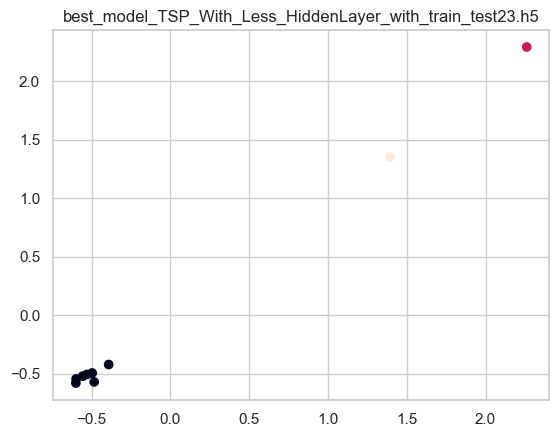

1/1 [==============================] - 0s 145ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


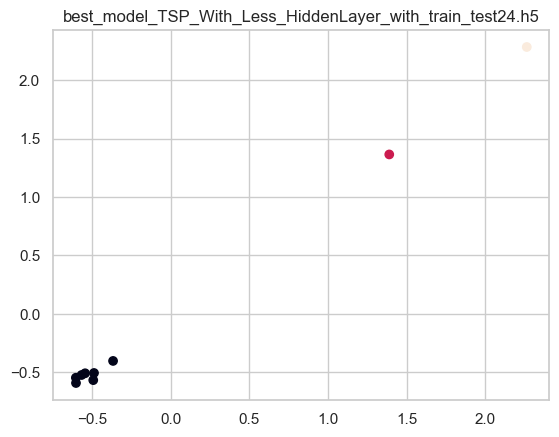

1/1 [==============================] - 0s 251ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


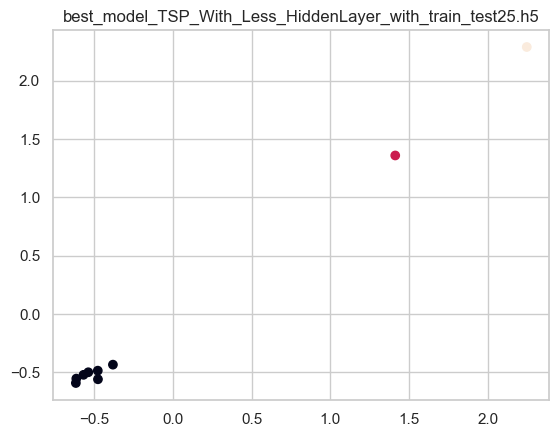

1/1 [==============================] - 0s 129ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


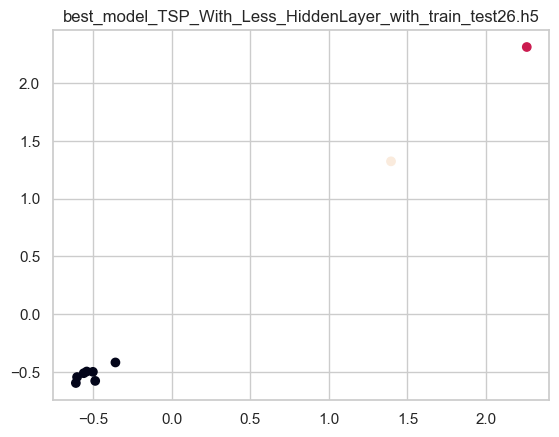

1/1 [==============================] - 0s 126ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


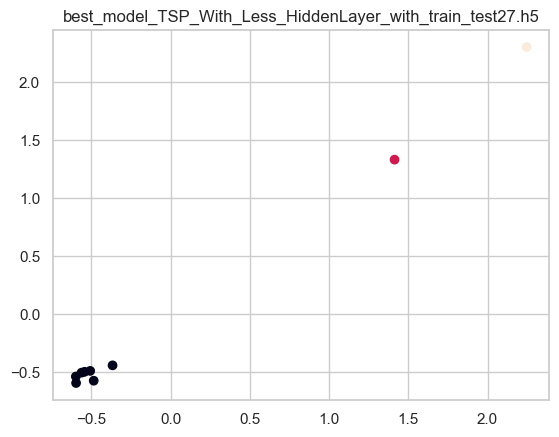

1/1 [==============================] - 0s 139ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


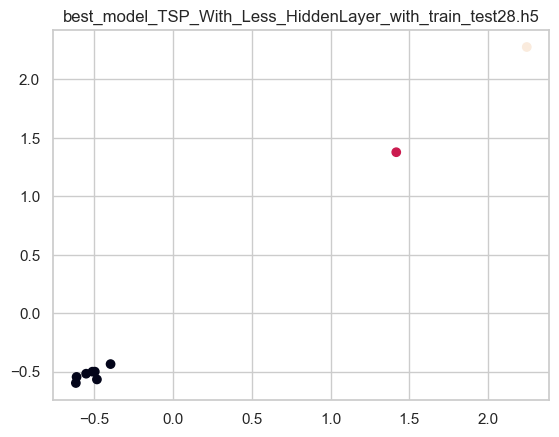

1/1 [==============================] - 0s 129ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


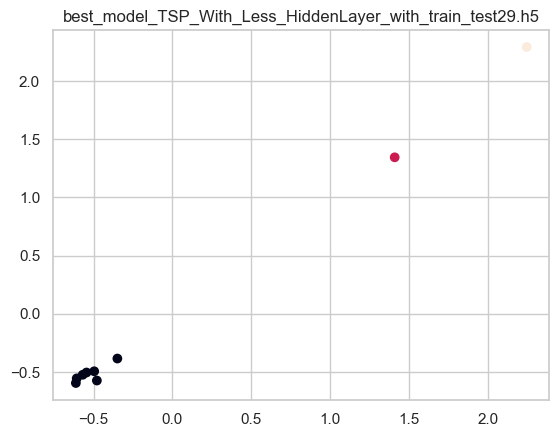

1/1 [==============================] - 0s 119ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


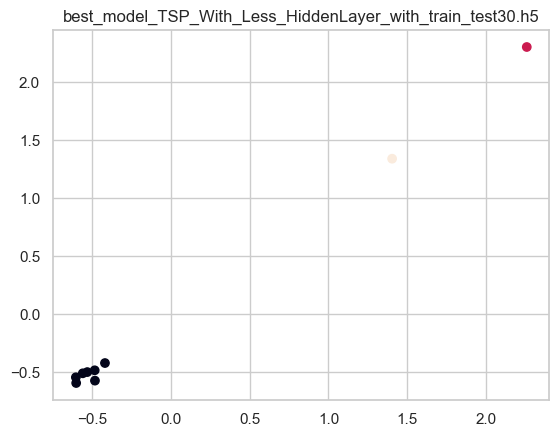

1/1 [==============================] - 0s 124ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


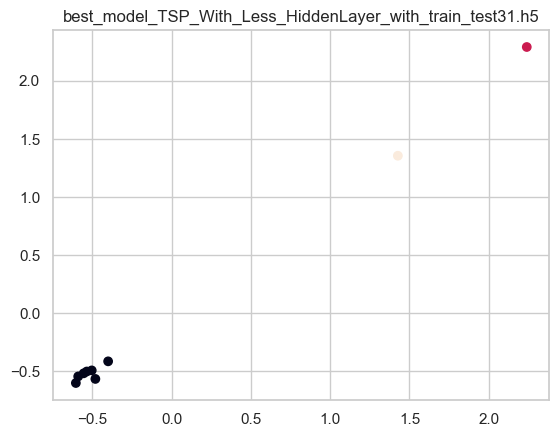

1/1 [==============================] - 0s 146ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


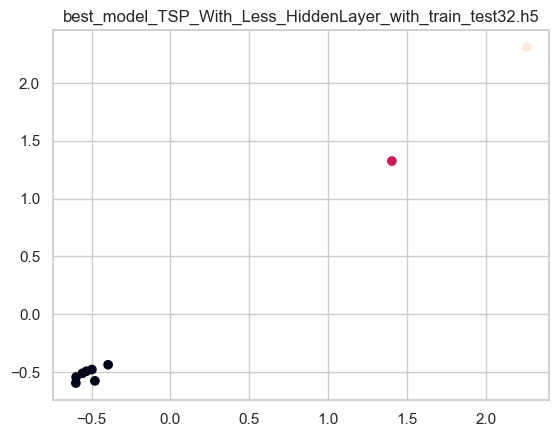

1/1 [==============================] - 0s 183ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


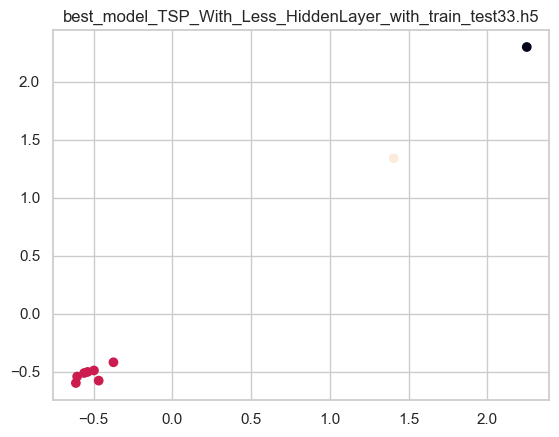

1/1 [==============================] - 0s 155ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


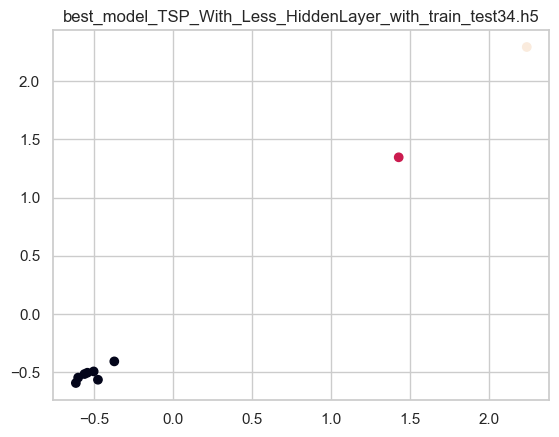

1/1 [==============================] - 0s 148ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


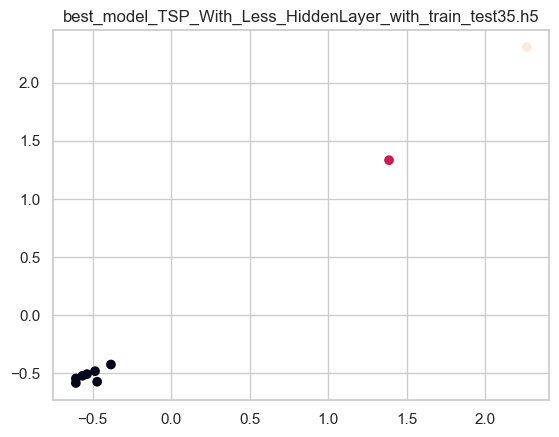

1/1 [==============================] - 0s 120ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


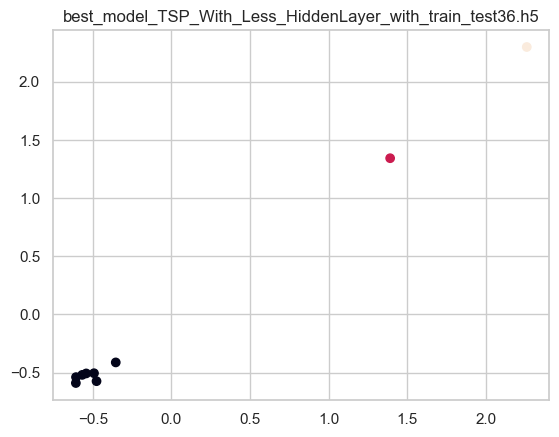

1/1 [==============================] - 0s 112ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


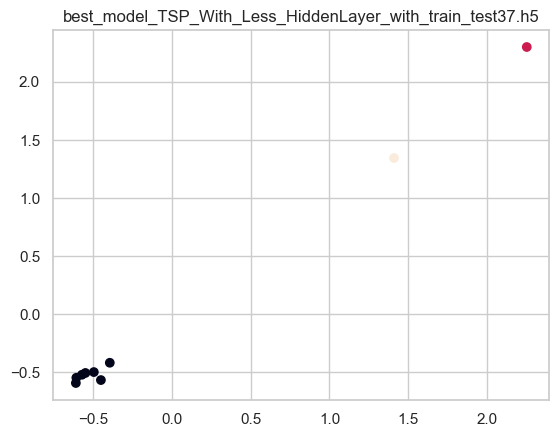

1/1 [==============================] - 0s 115ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


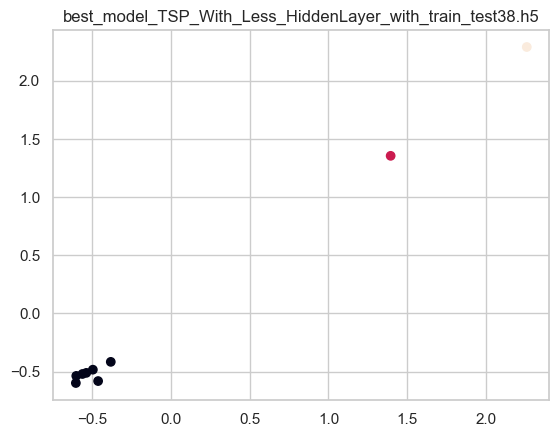

1/1 [==============================] - 0s 122ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


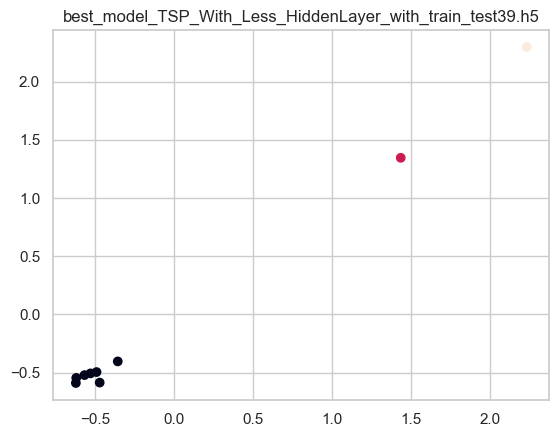

1/1 [==============================] - 0s 146ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


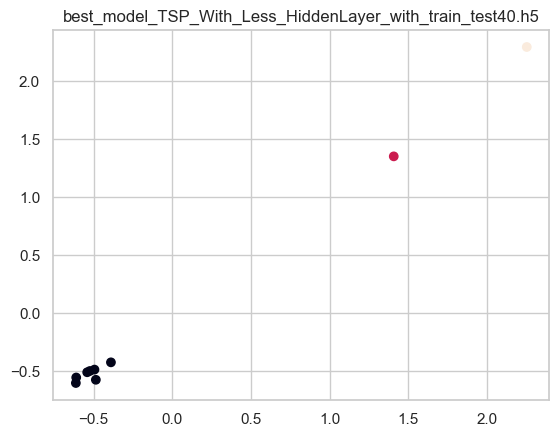

1/1 [==============================] - 0s 125ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


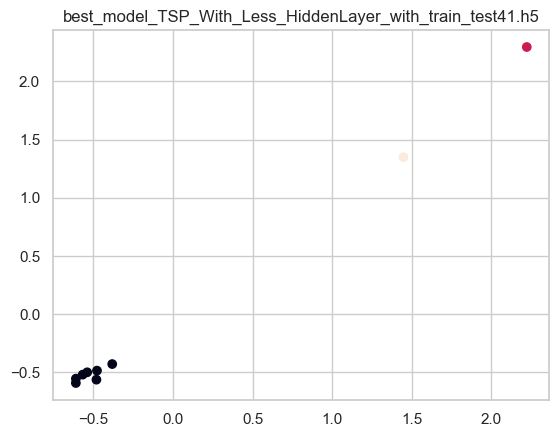

1/1 [==============================] - 0s 132ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


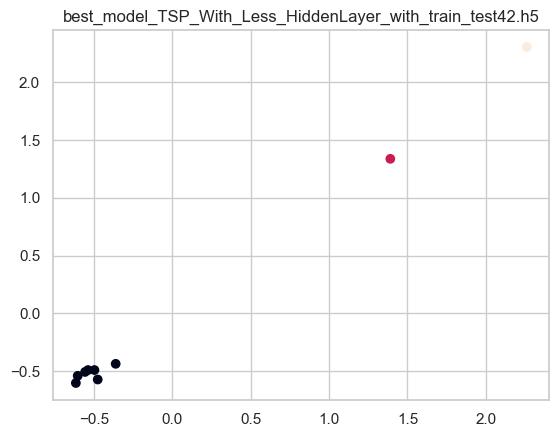

1/1 [==============================] - 0s 139ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


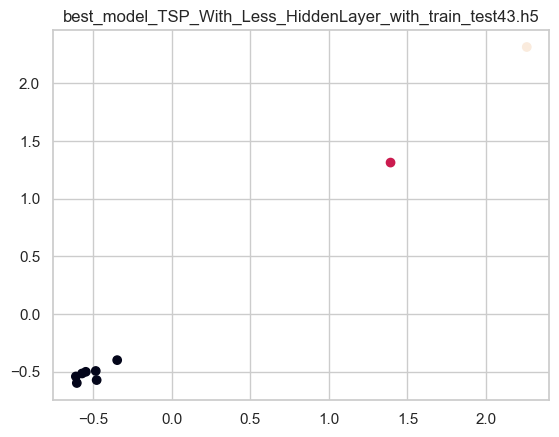

1/1 [==============================] - 0s 132ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


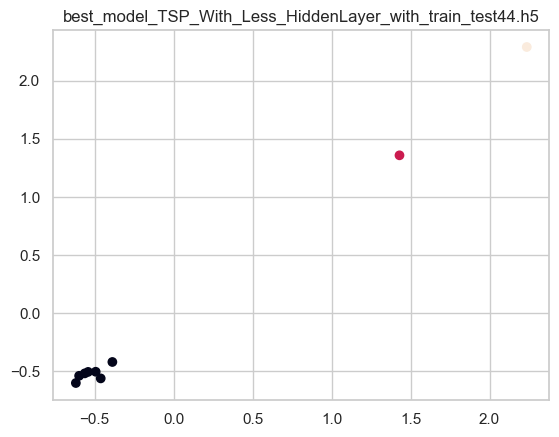

1/1 [==============================] - 0s 140ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


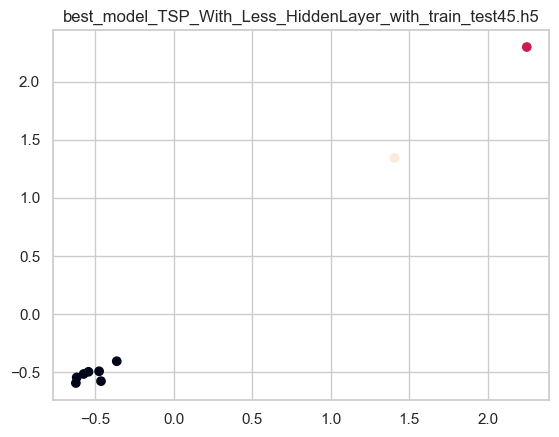

1/1 [==============================] - 0s 143ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


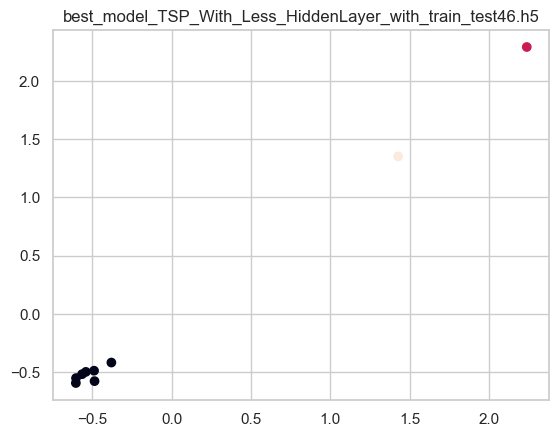

1/1 [==============================] - 0s 134ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


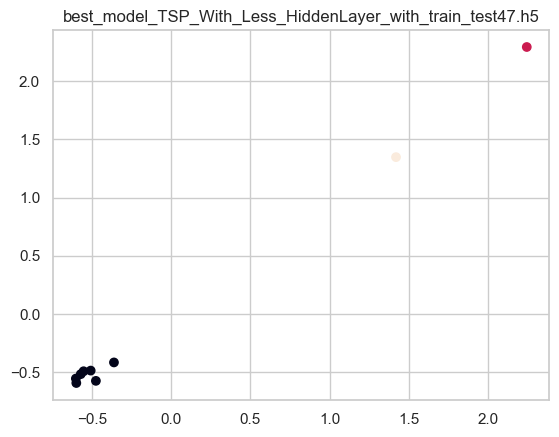

1/1 [==============================] - 0s 128ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


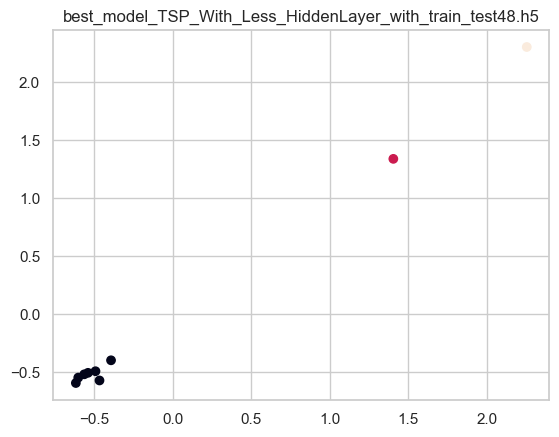

1/1 [==============================] - 0s 133ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


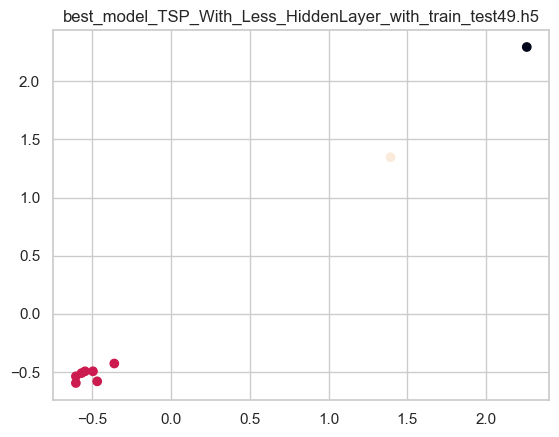

1/1 [==============================] - 0s 136ms/step


C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


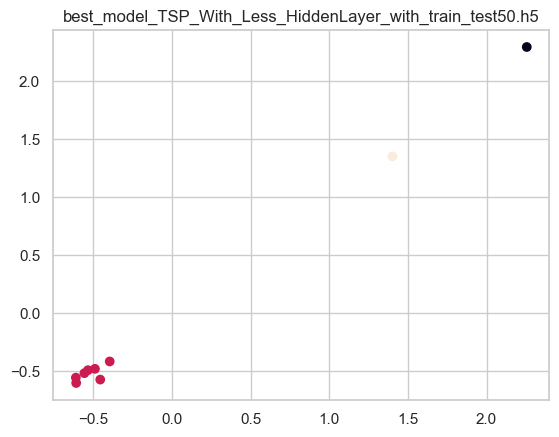

In [58]:
models_dir = 'models'
for model_name in os.listdir(models_dir):
    if model_name.endswith('.h5'):
        model_path = os.path.join(models_dir, model_name)
        model = load_model(model_path)

        encoded_data = model.predict(test_data)

        if encoded_data.ndim != 2:
            encoded_data = encoded_data.reshape(encoded_data.shape[0], -1)

        scaler = StandardScaler()
        encoded_data_std = scaler.fit_transform(encoded_data)

        kmeans = KMeans(n_clusters=3)  
        clusters = kmeans.fit_predict(encoded_data_std)

        plt.scatter(encoded_data_std[:, 0], encoded_data_std[:, 1], c=clusters)
        plt.title(model_name)
        plt.show()